# Part Two: Loan Analysis & Prediction

University of Maryland - Info Challenge 2022

Team 32: Danny Rivas, Javan Reuto

Date: 03/05/22

---

## Loan Analysis

After cleaning our data in the Part One, we are now ready to start analyzing the data.

First, we'll import our libraries.

In [1]:
#Importing libraries
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns


After importing relevant libraries, we'll import the removed loans dataset and the dataset will both removed and full loans.

In [2]:
#Importing datasets
ga_removed_df = pd.read_csv('ppp-ga-removed-clean.csv')
ga_df = pd.read_csv('ppp-ga-clean.csv', low_memory=False)

#Delete unnecassary col
del ga_df['Unnamed: 0']

### Defining Characteristics Of Removed Loans

Before comparing Removed Loans to Full Loans, we need to investigate the Removed Loans.

#### Jobs Retained by Business Type

We created a dataframe that groups Removed Loans by business type, average jobs retained and average loan amount. We want to investigate if there are any business types that have more workers that may need higher loans.

In [3]:
pd.set_option('max_columns', 50)

# groups business type and captures the count of jobs retained in each business type
businesstype_jobs = ga_removed_df.groupby(by=['business_type'])[['jobs_retained','amount']].mean().sort_values(by='amount', ascending=False)
businesstype_jobs = businesstype_jobs.reset_index()
businesstype_jobs

,business_type,jobs_retained,amount
0,501(C)3 – NON PROFIT,5.833333,151043.131667
1,CORPORATION,6.673981,69870.952320
2,PROFESSIONAL ASSOCIATION,4.058824,65230.117647
3,NON-PROFIT ORGANIZATION,5.968750,58371.250000
4,SUBCHAPTER S CORPORATION,3.978378,41997.709297
5,LIMITED LIABILITY COMPANY(LLC),2.872109,31833.373299
6,LIMITED LIABILITY PARTNERSHIP,4.257143,24723.402286
7,PARTNERSHIP,2.347826,24527.479130
8,SINGLE MEMBER LLC,1.633058,23126.942512
9,QUALIFIED JOINT-VENTURE (SPOUSES),1.000000,20833.000000


***Observation:***

We can see how loans differ in the average number of jobs retained and loan amount requested. On average, corporations had the highest number of jobs retained. Interestingly, organizations that were categorized as Tax-Exempt Nonprofits requested the most amount of money. We can assume that perhaps some of the Tax-Exempt Nonprofits did not need the loans as much as others and were asked to pay back the loans. 

#### Types of Businesses & Total Loans

While Tax-Exempt Nonprofits recieved the highest loan amount average, this group of organizations didn't recieve the most loans. We will now create a stacked histogram by Business Type and Sum of Loans. We'll color code the bars with LMI indicator.

The LMI indicator shows whether or not a business is in a Low-Moderate income community. According to the [SBA](#https://www.sba.gov/funding-programs/loans/covid-19-relief-options/paycheck-protection-program/ppp-lender-information), the "critical goal from Congress for the 2021 round of PPP was to reach small and low- and moderate-income (LMI) businesses who have not received the needed relief a forgivable PPP loan provides." In other words, PPP loans were intended on helping relatively-low income communities.

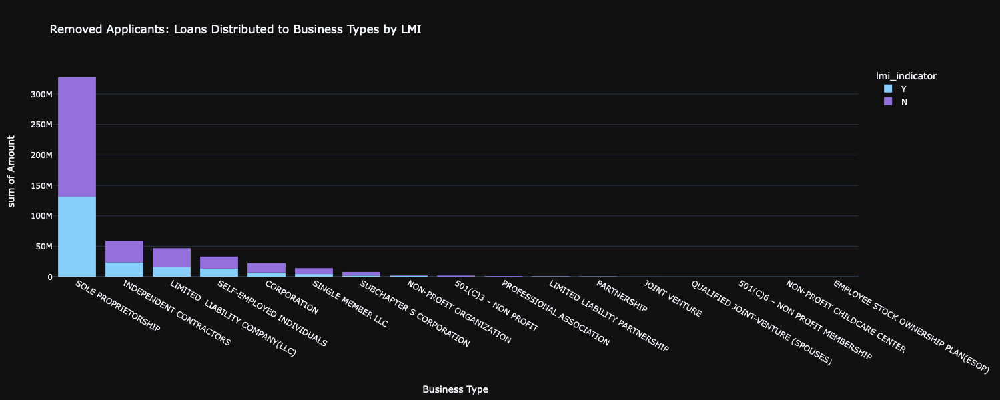

In [4]:

#creating stacked histogram by business type for amount of loans and lmi indicator
gr_hist = px.histogram(ga_removed_df, x='business_type', y='amount',
                        hover_data=['amount'],
                        labels={'amount':'Amount', 
                                'business_type':'Business Type'},
                        color = 'lmi_indicator',
                        height=600,
                        template='plotly_dark',
                        color_discrete_sequence=['LightSkyBlue', 'MediumPurple'],
                        title='Removed Applicants: Loans Distributed to Business Types by LMI'
                        )
gr_hist.update_layout(xaxis={'categoryorder': 'total descending'})
gr_hist.show()


***Inference*:**

Over $300 million were dispersed to Sole Proprietorships. Of these loans, more than half went to business that were **not** in a LMI community. In addition, the majority of loans that were given to other business types were not part of a LMI community. We can assume being in a LMI community, played a role in whether or not a loan was removed.

#### NAICS Name        
The North American Industry Classifcation System (NAICS), is used to classify businesses by their activity. Each business in our datasets had a NAICS code, in our code preparation we mapped NAICS name to the codes. Given NAICS name, we can see which business activity appeared the most in the Removed loans dataset.

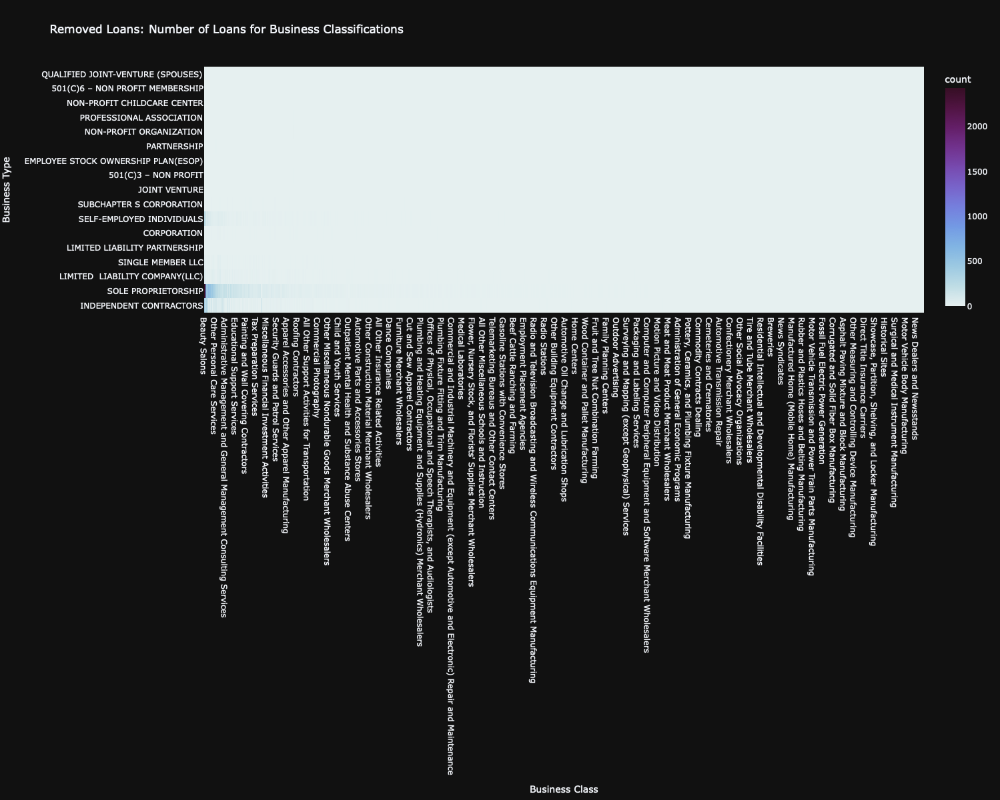

In [5]:
ga_removed_df= ga_removed_df.sort_values(by='amount')
gr_heat = px.density_heatmap(ga_removed_df, x='naics_name', y='business_type',
                             height=1200,
                             labels={'business_type': 'Business Type', 
                                     'naics_name':'Business Class'
                                     },
                             template='plotly_dark',
                             color_continuous_scale='dense',
                             title='Removed Loans: Number of Loans for Business Classifications'
                             )
gr_heat.update_layout(xaxis={'categoryorder': 'total descending'})

gr_heat.show()

With this interactive heatmap, we can zoom in on different areas of the figure. If we zoom in to the bottom left corner we can find insightful information.

***Inference:***

We can see that businesses that appeared the most in removed loans, were Sole Proprietorships and Independent Contractors. Amongst highest Business Classes that were removed are:
* Beauty Services
* Taxis
* Barbers
* Janitorial Services
* Lanscaping 

From an accounting standpoint, it's highly likely that these businesses operate on a cash basis. In other words, cash is recognized when it's recieved rather than when a service or product is sold. Typically smaller businesses use this method of accounting which also comes with less public scrutiny from investors, such as the Securities & Exchange commission. *What does this mean?* These businesses are vulnerable to accounting errors that may be fraudulent. 

#### Mapping Poverty Rates & Loan Amounts by City

Using Latitude and Longitude data, we can further investigate what cities recieved the higher loans on average and gauge the economic state of each one. We'll include poverty percentage to see how healthy city economies are. Ideally, we would like to see areas with higher poverty rates with higher loan amounts. 

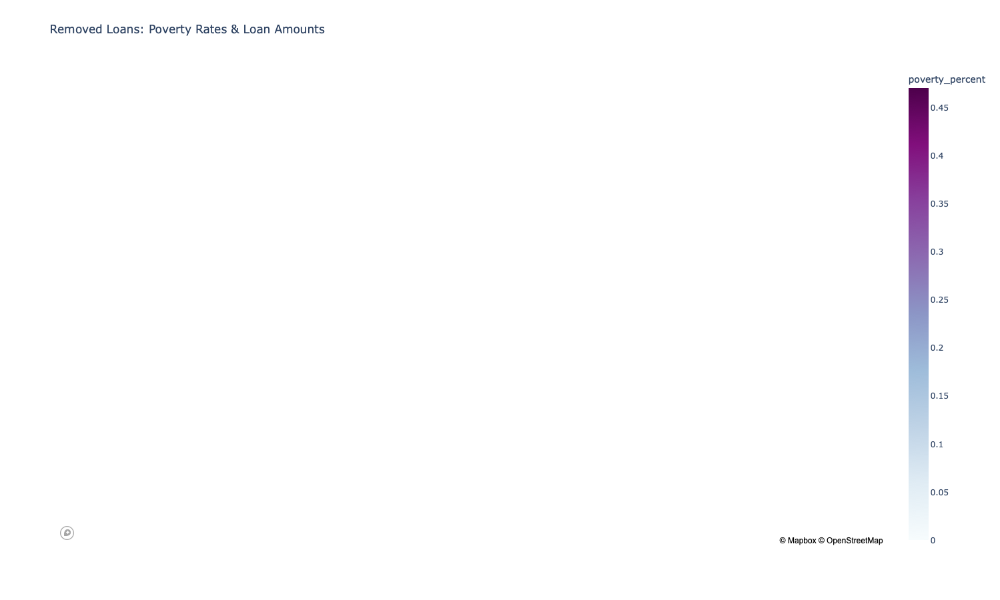

In [6]:
#Group removed data by city
ga_removed_cens = ga_removed_df.groupby('city').mean()
ga_removed_cens.dropna()
#Add access token
mapbox_access_token = 'pk.eyJ1IjoiZGFubnlyaXZhcyIsImEiOiJjbDBjbjhrbXEwMHM4M25teGI3NG96OHcwIn0.WhCiY_NpUYr-GDrcPSbPOg'

px.set_mapbox_access_token(mapbox_access_token)

gr_map_poverty = px.scatter_mapbox(ga_removed_cens, 
                                   lat = 'lat',
                                   lon = 'long',    
                                   color = 'poverty_percent',
                                   size = 'amount',
                                   color_continuous_scale='BuPu',
                                   height = 900, zoom=6.5,
                                   title='Removed Loans: Poverty Rates & Loan Amounts'
                                   )

gr_map_poverty.update_layout(
    mapbox_style = 'dark')

gr_map_poverty.show()

***Inference:***

We can see how cities with lower poverty rates, recieved the higher loans on average. While all of the loans in this visualization are removed, we can see a trend. Cities that generally have a healthier economy, with more people employed, recieved higher loan amounts. Of course, if these areas are "thriving" then it's possible the SBA saw repayment of those loans fit.

### Removed Loans Versus All Loans

Now we'll compare the removed loans to all the loans in the full dataset. First we'll group the data by LMI hubs. To create a sunburst chart to compare the two datasets. 

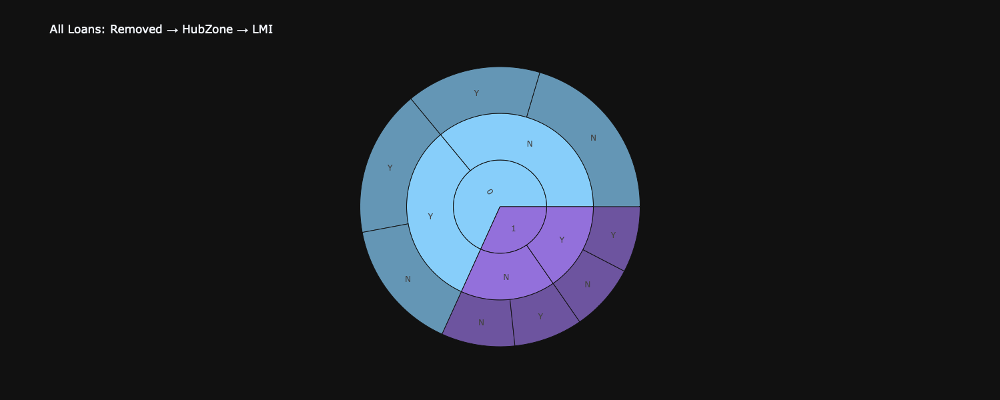

In [7]:
#Create a new df by grouping
ga_rem = ga_df.groupby(['Removed','hubzone_indicator','lmi_indicator']).mean().reset_index()

ga_sun = px.sunburst(ga_rem, path=['Removed','hubzone_indicator', 'lmi_indicator'], 
                     values='amount',
                     template='plotly_dark',
                     color_discrete_sequence=['LightSkyBlue', 'MediumPurple'],
                     title='All Loans: Removed → HubZone → LMI',
                     height=600
                     )
ga_sun.show()

#### Demographic Analysis

We can gain more insight by looking at city demographics. Below we'll make a scatter plot for each city. We'll look at how Removed and Unremoved loans compare in diversity, poverty levels, and average loan amounts. 

In [39]:
ga_df.hubzone_indicator = ga_df.hubzone_indicator.map(dict(Y=1, N=0))
ga_df.lmi_indicator = ga_df.lmi_indicator.map(dict(Y=1, N=0))

In [40]:
#ga_df.lmi_indicator = ga_df.lmi_indicator.map(dict(Y=1, N=0))
df_census = ga_df.groupby(['Removed','city']).mean().reset_index()

df_scatter = px.scatter(df_census, x='poverty_percent',y='minority_percent',
                 size='amount', 
                 color='Removed',
                 hover_name='population', 
                 labels={'minority_percent': 'Diversity', 
                         'poverty_percent':'Poverty Level'
                        },
                 template='plotly_dark',
                 color_continuous_scale='Pinkyl',
                 trendline='ols',
                 title='Amounts of Loans Given in Diverse or Impoverished Cities',
                 log_x=True, size_max=60)

#fig.xaxis(scaleanchor = "x", scaleratio = 1)

df_scatter.show()

***Observation:***

Above, we can see there is a relatively strong correlation between diversity levels and poverty levels. As Diversity, or number of minorities in a city increase, so does the level of poverty. In addition, the size of each marker represents the average loan size for a specific city. The higher the marker the higher the average loan size in that city. We can see that cites that had lower diversity levels recieved more loans and larger loan sizes. While this chart does not give us a reason as to why some loans were removed, we can see that loans that were removed recieved smaller loans on average.


#### Loans Over Time
The last metric we want to look at are loans approved over time. This may provide insight on what time of the year was it ideal to apply for a loan. 

In [37]:
xy = pd.crosstab(index=ga_df.date_approved, columns=ga_df['Removed']).reset_index()

vs_time = px.line(xy, x='date_approved', y=xy.columns,template='plotly_dark',
                  labels={'value': 'Number of Loans', 
                         'date_approved':'Time'
                         },
                   color_discrete_sequence=['LightSkyBlue', 'MediumPurple'],
                title='Loans Approved Over Time')
vs_time.show()
df = px.data.stocks()


***Inference:***

At the beginning of the pandemic, we see a peak in number of loans approved. These loans all went to loans that were not removed by the SBA. Towards the beginning of March 2021, we can see that loans that were eventually removed from the dataset, started to appear. It's possible that loans that were removed, were loans that were not forgiven. We know now that loans given at the beginning of the pandemic were eventually forgiven. Given there was a second wave in COVID-19 cases, it's possible that more people started to apply, and the SBA had measures in place to perhaps better determine the qualifcations of a loan applicant.

# Loan Prediction

In [13]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [14]:
#Loading clean full ga loan application dataset
ga_full_df = pd.read_csv('ppp-ga-full-clean.csv', low_memory=False)
#Delete unnecassary col
del ga_full_df['Unnamed: 0']


In [15]:
#Creating function to split dataframe into chunks
def even_split(df, df2):
    #Nested function to shuffle dataframe
    def shuffle(df):
        df = df.sample(frac=1)
        return df
    #Shuffling dataframe
    df = shuffle(df)
    
    #Creating ratio to break dataframe to chunk
    numerator = len(df2.index)
    denominator = numerator+len(df.index)
    fraction = numerator/denominator 

    df_length = (len(df) * fraction)
    df_length  = round(df_length)

    #breaking dataframe into chunk using iloc
    df_short = df.iloc[0:df_length , :]

    return df_short

ga_chunk = even_split(ga_full_df, ga_removed_df)


In [16]:
#Concat chunk and removed dataframe
ga_1_balanced = pd.concat([ga_chunk, ga_removed_df]).reset_index()

In [17]:
#Keep only variables for the model 
ga_1_balanced = ga_1_balanced[['amount', 
                               'city', 
                               'business_type', 
                               'jobs_retained', 
                               'date_approved', 
                               'congressional_district',
                               'sba_office_code',
                               'processing_method',
                               'loan_status',
                               'term',
                               'initial_approval_amount',
                               'current_approval_amount',
                               'undisbursed_amount',
                               'servicing_lender_state',
                               'rural_urban_indicator',
                               'hubzone_indicator',
                               'business_age_description',
                               #'project_state',
                               'originating_lender_state',
                               'forgiveness_amount',
                               'naics_name',
                               'population',
                               'median_income',
                               'minority_percent',
                               'poverty_percent',
                               'Removed']]
ga_1_balanced

,amount,city,business_type,jobs_retained,date_approved,congressional_district,sba_office_code,processing_method,loan_status,term,initial_approval_amount,current_approval_amount,undisbursed_amount,servicing_lender_state,rural_urban_indicator,hubzone_indicator,business_age_description,originating_lender_state,forgiveness_amount,naics_name,population,median_income,minority_percent,poverty_percent,Removed
0,20833.0,DECATUR,SOLE PROPRIETORSHIP,1,2021-04-24,GA-04,405,PPP,EXEMPTION 4,60,20833.0,20833.0,0.0,FL,U,N,EXISTING OR MORE THAN 2 YEARS OLD,FL,0.00,Caterers,47980.0,40485.0,0.880992,0.200875,0
1,11160.0,SUWANEE,SOLE PROPRIETORSHIP,1,2021-05-12,GA-07,405,PPP,EXEMPTION 4,60,11160.0,11160.0,0.0,AZ,U,N,EXISTING OR MORE THAN 2 YEARS OLD,AZ,0.00,"Motorcycle, ATV, and All Other Motor Vehicle D...",79000.0,113333.0,0.415937,0.045203,0
2,116300.0,WARNER ROBINS,CORPORATION,41,2020-04-08,GA-08,405,PPP,PAID IN FULL,24,116300.0,116300.0,0.0,NC,U,N,EXISTING OR MORE THAN 2 YEARS OLD,NC,117773.13,Limited-Service Restaurants,57094.0,63157.0,0.407328,0.144043,0
3,16303.0,REX,CORPORATION,1,2021-05-01,GA-05,405,PPP,EXEMPTION 4,60,16303.0,16303.0,0.0,FL,U,Y,EXISTING OR MORE THAN 2 YEARS OLD,FL,0.00,Child Day Care Services,15015.0,59313.0,0.797003,0.094838,0
4,85907.9,DOUGLASVILLE,CORPORATION,5,2020-04-13,GA-13,405,PPP,PAID IN FULL,24,85907.9,85907.9,0.0,GA,U,N,EXISTING OR MORE THAN 2 YEARS OLD,GA,86529.26,Offices of Lawyers,67710.0,76057.0,0.500428,0.106602,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50515,985024.0,BROOKHAVEN,LIMITED LIABILITY COMPANY(LLC),34,2021-04-21,GA-06,405,PPP,ACTIVE UN-DISBURSED,60,985024.0,985024.0,985024.0,PA,U,Y,EXISTING OR MORE THAN 2 YEARS OLD,PA,0.00,Offices of Other Holding Companies,43011.0,104435.0,0.225407,0.069471,1
50516,1007400.0,MARIETTA,CORPORATION,201,2021-03-31,GA-06,405,PPS,ACTIVE UN-DISBURSED,60,1007400.0,1007400.0,1007400.0,WV,U,Y,EXISTING OR MORE THAN 2 YEARS OLD,WV,0.00,Temporary Help Services,33637.0,51878.0,0.651931,0.167494,1
50517,1600000.0,CONYERS,501(C)3 – NON PROFIT,15,2021-05-18,GA-13,405,PPP,ACTIVE UN-DISBURSED,60,1600000.0,1600000.0,1600000.0,NJ,U,N,EXISTING OR MORE THAN 2 YEARS OLD,NJ,0.00,Religious Organizations,28591.0,47411.0,0.505858,0.206149,1
50518,1624974.0,DORAVILLE,LIMITED LIABILITY COMPANY(LLC),78,2021-05-23,GA-06,405,PPP,ACTIVE UN-DISBURSED,60,1624974.0,1624974.0,1624974.0,CA,U,N,EXISTING OR MORE THAN 2 YEARS OLD,CA,0.00,Other Direct Selling Establishments,27796.0,48793.0,0.473090,0.186646,1


<AxesSubplot:ylabel='Removed'>

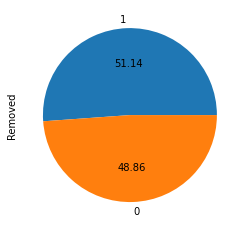

In [18]:
o = ga_1_balanced['Removed']
o.value_counts()
o.value_counts().plot.pie(autopct='%.2f')

In [19]:
ga_1_balanced['naics_name'].fillna('other', inplace = True)
ga_1_balanced['minority_percent'].fillna(0, inplace = True)
ga_1_balanced['poverty_percent'].fillna(0, inplace = True)
ga_1_balanced['population'].fillna(ga_1_balanced['population'].mean(),inplace=True)
ga_1_balanced['median_income'].fillna(ga_1_balanced['median_income'].mean(), inplace=True)
ga_1_balanced.isna().sum()


amount                      0
city                        0
business_type               0
jobs_retained               0
date_approved               0
congressional_district      0
sba_office_code             0
processing_method           0
loan_status                 0
term                        0
initial_approval_amount     0
current_approval_amount     0
undisbursed_amount          0
servicing_lender_state      0
rural_urban_indicator       0
hubzone_indicator           0
business_age_description    0
originating_lender_state    0
forgiveness_amount          0
naics_name                  0
population                  0
median_income               0
minority_percent            0
poverty_percent             0
Removed                     0
dtype: int64

In [20]:
ga_1_balanced.processing_method = ga_1_balanced.processing_method.replace({'PPP': 1, 'PPS': 0})
ga_1_balanced.sba_office_code = ga_1_balanced.sba_office_code.replace({405: 1, 455: 0, 474: 2})
ga_1_balanced.loan_status = ga_1_balanced.loan_status.replace({'PAID IN FULL': 1, 'EXEMPTION 4': 0, 'ACTIVE UN-DISBURSED': 2})
ga_1_balanced.rural_urban_indicator = ga_1_balanced.rural_urban_indicator.replace({'U': 1, 'R': 0})
ga_1_balanced.hubzone_indicator = ga_1_balanced.hubzone_indicator.replace({'N': 1, 'Y': 0})
#ga_1_balanced.project_state = ga_1_balanced.project_state.replace({'GA': 1, 'FL': 0})

In [21]:

def category_encoder(df, column):
    column_name = tuple(df[column].unique())
    column_name_df = pd.DataFrame(column_name, columns=['column_name_1'])
    
    labelencoder = LabelEncoder()
    
    column_name_df[f'column_name_cat'] = labelencoder.fit_transform(column_name_df['column_name_1'])
    
    column_name_df = column_name_df.set_index('column_name_1')
    encoded_dictionary = column_name_df.to_dict()['column_name_cat']
    
    df[column] = df[column].map(encoded_dictionary)
    return df

In [22]:
congressional_district = category_encoder(ga_1_balanced, 'congressional_district')
city = category_encoder(ga_1_balanced, 'city')
business_type = category_encoder(ga_1_balanced, 'business_type')
date_approved = category_encoder(ga_1_balanced, 'date_approved')
servicing_lender_state = category_encoder(ga_1_balanced, 'servicing_lender_state')
business_age_description = category_encoder(ga_1_balanced, 'business_age_description')
originating_lender_state = category_encoder(ga_1_balanced, 'originating_lender_state')
naics_name = category_encoder(ga_1_balanced, 'naics_name')

In [23]:
from sklearn.model_selection import train_test_split

In [24]:
print(tuple(ga_1_balanced['term'].unique()))
ga_1_balanced.nunique()

(60, 24, 45, 59, 5, 6, 23, 8, 52, 53)


amount                      15800
city                          532
business_type                  21
jobs_retained                 200
date_approved                 235
congressional_district         14
sba_office_code                 1
processing_method               2
loan_status                     3
term                           10
initial_approval_amount     15739
current_approval_amount     15800
undisbursed_amount           6024
servicing_lender_state         47
rural_urban_indicator           2
hubzone_indicator               2
business_age_description        5
originating_lender_state       47
forgiveness_amount          14233
naics_name                    863
population                    507
median_income                 512
minority_percent              513
poverty_percent               514
Removed                         2
dtype: int64

In [38]:
import plotly.express as px
fig = px.imshow(ga_1_balanced.corr(),aspect='equal', height=800,
                template='plotly_dark',
                color_continuous_scale='PuOr')



fig.show()



NameError: name 'ga_1_balanced' is not defined


%matplotlib inline 

import seaborn as sns
sns.set_style('dark')

plt.figure(figsize=(12,8))
sns.heatmap(ga_1_balanced.corr(), cmap='PuBu', annot=True, fmt='.1f', linewidths=.1)
plt.show()



In [26]:
ga_1_balanced.isna().sum()

amount                      0
city                        0
business_type               0
jobs_retained               0
date_approved               0
congressional_district      0
sba_office_code             0
processing_method           0
loan_status                 0
term                        0
initial_approval_amount     0
current_approval_amount     0
undisbursed_amount          0
servicing_lender_state      0
rural_urban_indicator       0
hubzone_indicator           0
business_age_description    0
originating_lender_state    0
forgiveness_amount          0
naics_name                  0
population                  0
median_income               0
minority_percent            0
poverty_percent             0
Removed                     0
dtype: int64

In [27]:
X = ga_1_balanced.iloc[:, ga_1_balanced.columns != 'Removed']
y = np.ravel(ga_1_balanced.iloc[:, ga_1_balanced.columns == 'Removed'])


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=42)

lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[5982,  172],
       [ 525, 5951]])

Text(0.5, 257.44, 'Predicted label')

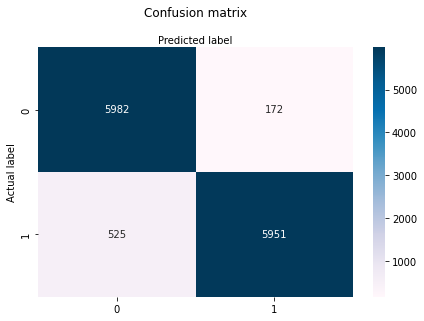

In [28]:
class_names=[0,1]
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="PuBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [29]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9448139350752177
Precision: 0.9719091948391312
Recall: 0.9189314391599753


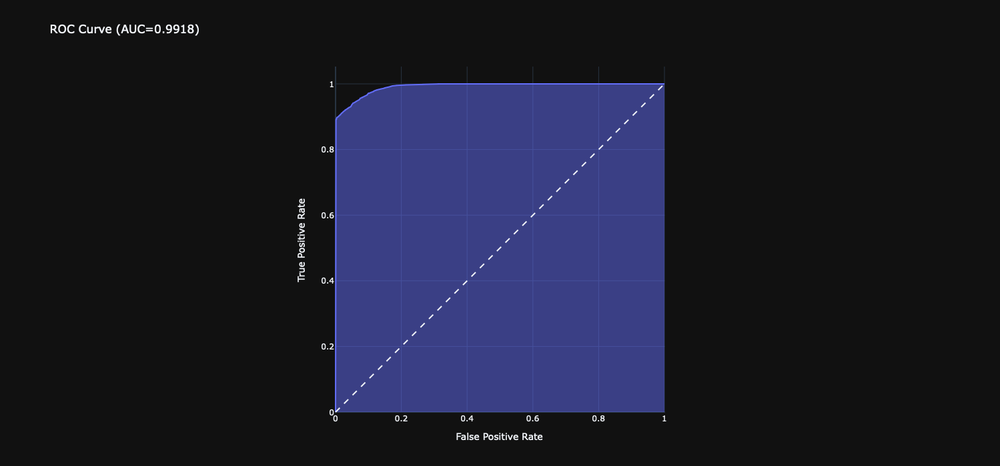

In [30]:

y_score = lr.predict_proba(X_test)[::,1]
fpr, tpr, thresh = metrics.roc_curve(y_test,  y_score)
auc = metrics.roc_auc_score(y_test, y_score)

roc = px.area(x=fpr, y=tpr, 
              title=f'ROC Curve (AUC={auc:.4f})',
              labels=dict(x='False Positive Rate', 
                          y='True Positive Rate'),
             height=700,
             template='plotly_dark'
             )

roc.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=0, y1=1)

roc.update_yaxes(scaleanchor="x", scaleratio=1)
roc.update_xaxes(constrain='domain')
roc.show()